# Pipeline for analysis of Galileo/SSI images with photometric models

## 1. Downloading Galileo/SSI images from Pilot

Image search tool: https://pilot.wr.usgs.gov/

Constraints:

1. Reasonable image resolution that provides large variation in emission/incidence angles for roughness modeling (between 0.5 to 5 km/pix should do)  
2. Coverage of entire globe with minimal overlaps
3. Low phase angle observations (<70 deg.), where the effect of multiple scattering on dilution of shadows is minimal (Buratti & Veverka (1985)), Domingue et al. (1991), Domingue and Hapke (1992))
4. Visible wavelength filters. Pretty much all shortlisted images were taken with clear filter. IR stuff is beyond the scope of this study.

**Note**: For each image, make sure to download both the **.img** and **.lbl** extension files. One contains the data and one contains important header info. The ISIS commands described below won't work without both files. 

## 2. Generate photometric cubes using ISIS

### 2.1. Basic setup

1. Install and set up ISIS: https://github.com/DOI-USGS/ISIS3#installation

    - **Note:** After a lot of trial-and-error, I found that **ISIS 8** and **Python 3.9** is a stable combo. This might have changed in the last couple of years though.

2. Need to download mission specific data so that we have the right kernels to do all the observation geometry calculations: https://astrogeology.usgs.gov/docs/how-to-guides/environment-setup-and-maintenance/isis-data-area/
    - `downloadIsisData galileo $ISISDATA`
3. Run the following commands for each image (i.e., a .lbl + .img pair):
    - `gllssi2iss`: 
        - Description: "Import a Galileo solid state imager (SSI) image EDR into Isis cube format"
        - Parameters: FROM=5126r.lbl TO=5126r.cub
    - `spiceinit`: 
        - Description: “Update SPICE data (kernels, pointing, and position) for a camera cube”
        - Parameters: FROM=5126r.cub WEB=false
    - `gllssical`: 
        - Description: “Perform Radiometric correction on GALILEO-SSI Imaging”
        - Parameters: FROM=5126r.cub TO=5126r_cal.cub 
    - `phocube`: 
        - Description: “Create photometric and geometric information bands for an image cube”
        - Parameters: FROM=5126r_cal.cub TO=5126r_cal.pho.cub DN=yes PHASE=yes EMISSION=yes INCIDENCE=yes LATITUDE=yes LONGITUDE=yes PIXELRESOLUTION=yes

**Note**: The last few rows of any ISIS-processed file contain all the commands used to generate it, i.e., a history of its creation. 

The *Image Files* folder in this repository contains raw and ISIS-processed files associated with the galileo image **5126r**, which we will use later when discussing analysis of photometric cubes.

### 2.2. Batch processing multiple images

In a folder full of .img and .lbl files for the shortlisted images, I ran the following bash script to generate the photometric cube files (with custom extensions of **.pho.cub**):


```bash
#!/bin/bash

# Define input and output directories
INPUT_DIR="All data files"
OUTPUT_DIR="All data files/Post ISIS"

# Make sure output directory exists
mkdir -p "$OUTPUT_DIR"

# Process each .lbl file in the input directory
for file in "$INPUT_DIR"/*.lbl; do
    # Get base name without path and extension
    base_name=$(basename "$file" .lbl)

    echo "Processing $base_name..."

    # Full paths for intermediate and output files
    cub_file="$OUTPUT_DIR/${base_name}.cub"
    cal_cub_file="$OUTPUT_DIR/${base_name}_cal.cub"
    pho_cub_file="$OUTPUT_DIR/${base_name}_cal.pho.cub"

    # Run ISIS processing
    gllssi2isis FROM="$file" TO="$cub_file"
    spiceinit FROM="$cub_file" WEB=false
    gllssical FROM="$cub_file" TO="$cal_cub_file"
    phocube FROM="$cal_cub_file" TO="$pho_cub_file" DN=yes PHASE=yes EMISSION=yes INCIDENCE=yes LATITUDE=yes LONGITUDE=yes PIXELRESOLUTION=yes
done

echo "Processing complete."

## 3. Use `galileo-ssi` to analyze the photometric cubes and extract terrain-specific data

Benoit Seignovert's fantastic [galileo-ssi](https://github.com/seignovert/galileo-ssi) package provides custom functions to perform various operations on an ISIS-processed Galileo/SSI image cube. 

Benoit has also provided various tutorial notebooks especially focused on Galileo/SSI images: https://github.com/seignovert/galileo-ssi/tree/master/notebooks

In the next few cells, I am just providing some highlights and use-cases for the package specific to our goal of extracting terrain specific data

In [1]:
# galileo-ssi packages

from ssi import SSI
from ssi.geol import EUROPA
from ssi.cmap import CondColormap, MaskColormap

# standard python packages
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['figure.dpi'] = 500

# custom utility package
from utils import bin_reflectance, scatter_ssi_footprints_on_europa


In [2]:
# Python ISIS3-SSI object parser
img = SSI('Image Files/Post ISIS/5126r_cal.pho.cub')

img

<SSI> Cube: 5126r
 - Size: (800, 800)
 - Start time: 1996-06-28 01:43:22+00:00
 - Filter name: CLEAR
 - Exposure: 0.00417 seconds
 - Main target: EUROPA
 - Data alignment: False

In [3]:
# Explore Image Layers (ISIS processing adds the geometry layers)

img.layers

['CLEAR',
 'Phase Angle',
 'Emission Angle',
 'Incidence Angle',
 'Latitude',
 'Longitude',
 'Pixel Resolution']

In [4]:
# Example layer: Data

img.data

array([[       nan,        nan, 0.6616845 , ..., 0.01874097, 0.02330439,
        0.01920273],
       [       nan,        nan, 0.5667658 , ..., 0.64417607, 0.64331275,
        0.62484866],
       [       nan,        nan, 0.5833956 , ..., 0.64018035, 0.6447313 ,
        0.6334495 ],
       ...,
       [       nan, 0.78587395, 0.796514  , ..., 0.5145454 , 0.48593405,
        0.48256457],
       [1.0838959 , 0.84181863, 0.76158404, ..., 0.46052158, 0.44188383,
        0.44267857],
       [5.486526  , 0.772195  , 0.7204898 , ...,        nan,        nan,
               nan]], dtype=float32)

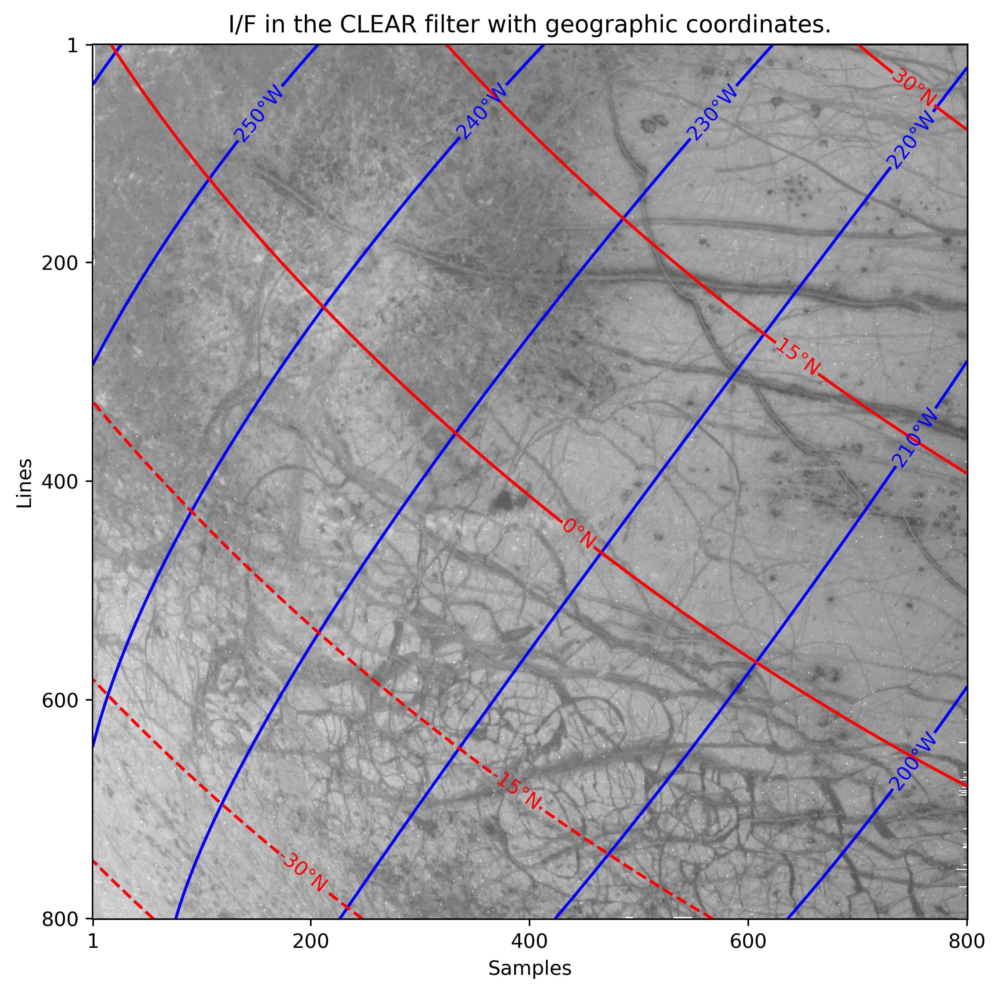

In [5]:
# Example plot: Plot geographic coordinates on the image

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.imshow(img.data, extent=img.extent, cmap='gray', vmin=0, vmax=1)
clon = ax.contour(img.lon, np.arange(0, 360, 10), extent=img.cextent, colors='b')
clat = ax.contour(img.lat, np.arange(-45, 45, 15), extent=img.cextent, colors='r')

plt.clabel(clon, inline=True, fmt='%.0f°W')
plt.clabel(clat, inline=True, fmt='%.0f°N')

ax.set_title(f'I/F in the {img.filter_name} filter with geographic coordinates.')

ax.set_xticks(img.sticks)
ax.set_yticks(img.lticks)

ax.set_xlabel(img.slabel)
ax.set_ylabel(img.llabel);

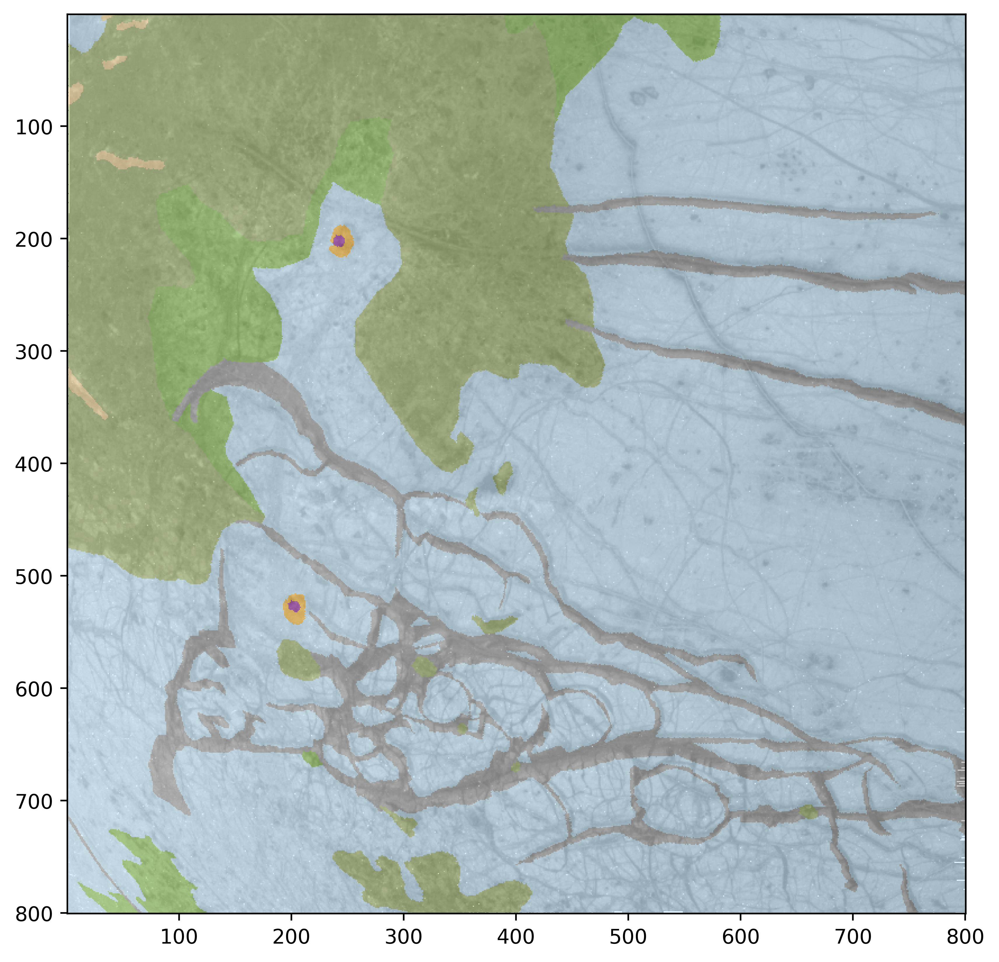

In [6]:
# Example plot: highlighting geological units in an image using an inbuilt color-map

fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(img.data, extent=img.extent, vmin=0, vmax=1, cmap='gray')
ax.imshow(EUROPA(img, legend=False), cmap=EUROPA.CMAP, extent=img.extent, alpha=.5);


**Note**: Although `galileo-ssi` uses an older version of the Europa geological map (Erin et al. published [a new Europa geological map](https://pubs.usgs.gov/publication/sim3513) in 2024), the differences are quite minor and pretty much only present in the naming conventions for different terrain units. Adopting the latest geological map into `galileo-ssi` is a project that unfortunately neither Benoit nor I have the time for currently...(perhaps a student project?)

Next I show a custom script I use to create a comprehensive plot, for a given .pho.cub file, that contains:
1. The footprint of on a map of Europa
2. Geological units present in the image
3. Reflectance v/s emission angle curves for each terrain present in the image (terrains with very few pixels are ruled-out as absent as well)

The reflectance v/s emission angle plots will serve as the basis for our photometric modeling in the next section

Processing 5126r_cal.pho.cub...


/opt/anaconda3/envs/photometry/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/anaconda3/envs/photometry/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/opt/anaconda3/envs/photometry/lib/python3.11/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/anaconda3/envs/photometry/lib/python3.11/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/anaconda3/envs/photometry/lib/python3.11/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


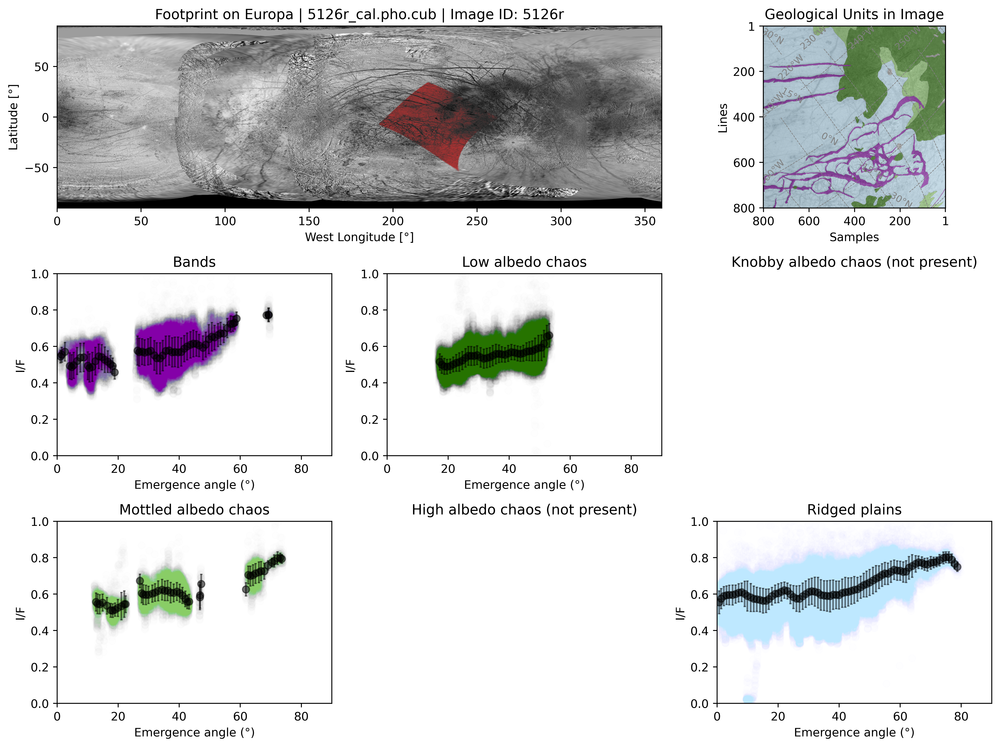

In [7]:
# Load SSI files (only one file in this example)

ssi_files = ['Image Files/Post ISIS/5126r_cal.pho.cub']

# Terrain types of interest (the terrain label names follow standard convention )
terrain_labels = [
    'Bands',
    'Low albedo chaos',
    'Knobby albedo chaos',
    'Mottled albedo chaos',
    'High albedo chaos',
    'Ridged plains'
]

# =====================
# MAIN LOOP
# =====================

for path in ssi_files:
    print(f"Processing {os.path.basename(path)}...")

    img = SSI(path)
    img_geol = EUROPA(img)
    image_id = os.path.basename(path).split('_')[0]

    terrain_panels = {}

    # Extract relevant terrain units
    for label in terrain_labels:
        terrain_mask = (img_geol == label)

        if not np.any(terrain_mask):
            terrain_panels[label] = None
            continue

        # Extract relevant pixels
        sub_data = img.data[terrain_mask]
        sub_emi = img.emi[terrain_mask]
        sub_inc = img.inc[terrain_mask]

        # Remove any rows with NaNs in any of the arrays
        valid_mask = np.isfinite(sub_data) & np.isfinite(sub_emi) & np.isfinite(sub_inc)

        if np.sum(valid_mask) < 10:
            terrain_panels[label] = None
            continue

        sub_data = sub_data[valid_mask]
        sub_emi = sub_emi[valid_mask]
        sub_inc = sub_inc[valid_mask]

        # Bin reflectance
        try:
            e_binned, _, i_binned, _, ref_binned, ref_binned_error = bin_reflectance(sub_data, sub_emi, sub_inc)
        except ValueError:
            terrain_panels[label] = None
            continue

        color = EUROPA.color(label)

        terrain_panels[label] = {
            'label': label,
            'mask': terrain_mask,
            'data': sub_data,
            'emi': sub_emi,
            'inc': sub_inc,
            'binned_e': e_binned,
            'binned_i': i_binned,
            'binned_ref': ref_binned,
            'binned_err': ref_binned_error,
            'color': color
        }

    # =====================
    # PLOTTING
    # =====================

    # Create 3x3 layout
    fig = plt.figure(figsize=(12, 9))
    gs = gridspec.GridSpec(nrows=3, ncols=3, figure=fig)

    # === TOP ROW ===

    # Footprint panel: span columns 0 and 1
    ax_map = fig.add_subplot(gs[0, 0:2])
    scatter_ssi_footprints_on_europa(ax_map, [path], alpha=0.005, point_color='#a83232')
    ax_map.set_title(f"Footprint on Europa | {os.path.basename(path)} | Image ID: {image_id}")
    ax_map.set_xlim(0, 360)
    ax_map.set_ylim(-90, 90)
    ax_map.set_xlabel("West Longitude [°]")
    ax_map.set_ylabel("Latitude [°]")

    # Geological overlay panel: column 2
    ax_img = fig.add_subplot(gs[0, 2])
    ax_img.imshow(img.data, extent=img.extent, vmin=0, vmax=1, cmap='gray')
    for panel in terrain_panels.values():
        if panel is not None:
            overlay = np.ma.masked_where(~panel['mask'], np.ones_like(img.data))
            ax_img.imshow(overlay, extent=img.extent, cmap=MaskColormap(panel['color'], alpha=0.5))
    
    # Add contour lines for lon and lat (in gray)
    clon = ax_img.contour(img.lon, np.arange(0, 360, 10), extent=img.cextent, colors='gray', linewidths=0.5, linestyles='--')
    clat = ax_img.contour(img.lat, np.arange(-90, 91, 15), extent=img.cextent, colors='gray', linewidths=0.5, linestyles='--')

    # Label contours
    plt.clabel(clon, inline=True, fmt='%.0f°W', fontsize=8)
    plt.clabel(clat, inline=True, fmt='%.0f°N', fontsize=8)

    # Fix the axes so west longitude increases left → right
    ax_img.invert_xaxis()

    # Tick marks and axis labels
    ax_img.set_xticks(img.sticks)
    ax_img.set_yticks(img.lticks)
    ax_img.set_xlabel(img.slabel)
    ax_img.set_ylabel(img.llabel)
    ax_img.set_title("Geological Units in Image")

    # === SECOND & THIRD ROWS: terrain plots ===
    terrain_axes = []
    for row in [1, 2]:
        for col in range(3):
            terrain_axes.append(fig.add_subplot(gs[row, col]))

    for ax, label in zip(terrain_axes, terrain_labels):
        panel = terrain_panels.get(label)
        if panel is None:
            ax.set_title(f"{label} (not present)")
            ax.axis('off')
        else:
            ax.scatter(panel['emi'], panel['data'], color=panel['color'], alpha=0.002, zorder=1)
            ax.errorbar(panel['binned_e'], panel['binned_ref'], yerr=panel['binned_err'],
                        fmt='o', color='black', capsize=1, zorder=2, alpha=0.5)
            ax.set_xlim(0, 90)
            ax.set_ylim(0, 1)
            ax.set_xlabel('Emergence angle (°)')
            ax.set_ylabel('I/F')
            ax.set_title(label)

    fig.tight_layout()


Let's save the 'Low albedo chaos' data for the model-fitting example later

In [8]:
panel = terrain_panels.get('Low albedo chaos')

if panel is not None:
    np.savez(
        f"{image_id}_low_albedo_chaos.npz",
        data      = panel['data'],
        emi       = panel['emi'],
        inc       = panel['inc'] if 'inc' in panel else None,   # if you add inc to panel
        binned_e  = panel['binned_e'],
        binned_i  = panel['binned_i'],
        binned_ref = panel['binned_ref'],
        binned_err = panel['binned_err'],
        mask      = panel['mask']
    )
    print(f"Saved low albedo chaos data → {image_id}_low_albedo_chaos.npz")
else:
    print("No Low Albedo Chaos present in this image.")

Saved low albedo chaos data → 5126r_low_albedo_chaos.npz


## 4. Extract photometric properties

### 4.1. Crater reflectance model (Buratti & Veverka, 1985)

Bonnie's crater reflectance model ([Burrati & Veverka (1985)](https://ui.adsabs.harvard.edu/abs/1985Icar...64..320B)) fits for the surface roughness of an airless body

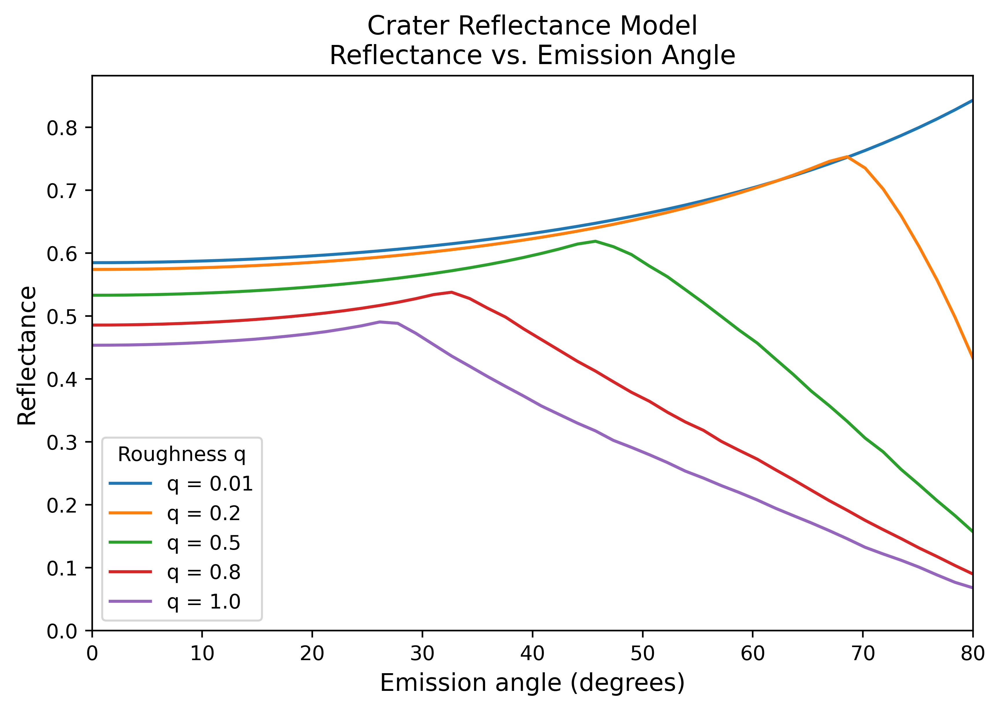

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from model import crater_reflectance

# Fixed geometry
inc = 30.0       # incidence angle in degrees
phase = 30.0     # phase angle in degrees

# Photometric parameters (reasonable demo values)
A = 0.7
f_alpha = 1.0

# Roughness values to illustrate
q_values = [0.01, 0.2, 0.5, 0.8, 1.0]

# Emission angle range
emi_vals = np.linspace(0, 80, 50)

plt.figure(figsize=(7,5))

for q in q_values:
    refl = [crater_reflectance(inc, emi, phase, q, A, f_alpha) 
            for emi in emi_vals]
    plt.plot(emi_vals, refl, label=f"q = {q}")

plt.xlabel("Emission angle (degrees)", fontsize=12)
plt.ylabel("Reflectance", fontsize=12)
plt.title("Crater Reflectance Model\nReflectance vs. Emission Angle", fontsize=13)
plt.legend(title="Roughness q", fontsize=10)
plt.xlim(0, 80)
plt.ylim(bottom=0)
plt.tight_layout()

The roughness parameter $q$ determines the characteristic 'inflection' point in this model

### 4.2. Fitting the crater-reflectance model to SSI data

We will apply the crater reflectance model to the 'Low albedo chaos' data we saved earlier.

**Note:** Here we fit for $A$ and $f_{\alpha}$ along with the roughness parameter $q$. However, one can also directly plug in terrain-specific $A$ and $f_{\alpha}$ values derived by [Dhingra et al (2021)](https://ui.adsabs.harvard.edu/abs/2021PSJ.....2..144D). See the `get_A_and_f_alpha` function in the *model* module

Fit results using (inc, emi) pairs:
  q       = 0.545 ± 0.000
  A       = 0.743 ± 0.185
  f_alpha = 0.864 ± 0.138


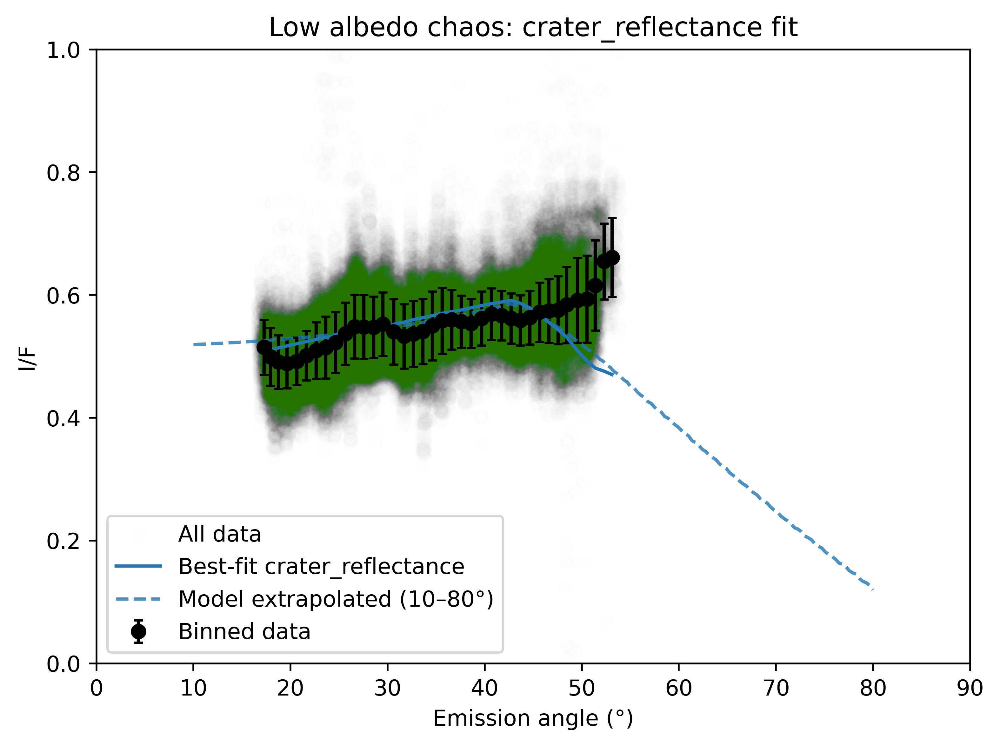

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from model import crater_reflectance

# ============================
# 1. Load saved terrain data
# ============================

fname = "5126r_low_albedo_chaos.npz"  
d = np.load(fname)

ref         = d['data']            # data 
e           = d['emi']             # emission angles
binned_e    = d["binned_e"]        # binned emission angles (deg)
binned_i    = d["binned_i"]        # binned incidence angles (deg)
binned_ref  = d["binned_ref"]      # binned reflectance
binned_err  = d["binned_err"]      # binned reflectance uncertainties

# Phase angle for this image (deg)
phase_angle = 37.8   # mean of the phase angle layer in the photometric cube

# ======================================
# 2. Model
# ======================================

def model_pairwise(emi, q, A, f_alpha):
    """
    curve_fit only passes 'emi' as first argument,
    so we pull incidence from closure variables.
    """
    return np.array([
        crater_reflectance(inc, em, phase_angle, q, A, f_alpha)
        for inc, em in zip(binned_i, emi)
    ])

# Initial guesses & parameter bounds
p0     = [0.3, 0.7, 1.0]       # q, A, f_alpha initial guess
bounds = ([0.0, 0.0, 0.0],     # lower bounds
          [2.0, 1.0, 2.0])     # upper bounds

# ======================================
# 3. Fit q, A, f_alpha
# ======================================

popt, pcov = curve_fit(
    model_pairwise,
    binned_e,
    binned_ref,
    sigma=binned_err,
    absolute_sigma=True,
    p0=p0,
    bounds=bounds
)

q_fit, A_fit, f_alpha_fit = popt
q_err, A_err, f_alpha_err = np.sqrt(np.diag(pcov))

print(f"Fit results using (inc, emi) pairs:")
print(f"  q       = {q_fit:.3f} ± {q_err:.3f}")
print(f"  A       = {A_fit:.3f} ± {A_err:.3f}")
print(f"  f_alpha = {f_alpha_fit:.3f} ± {f_alpha_err:.3f}")

# ======================================
# 4. Extrapolated model curve (10–80°) for visualization
# ======================================

# Extrapolated emission angle grid
emi_ext = np.linspace(10, 80, 200)

# For these points, use a representative incidence angle
inc_rep = np.median(binned_i)

# Evaluate model on extended grid
ref_ext = np.array([
    crater_reflectance(inc_rep, e, phase_angle, *popt)
    for e in emi_ext
])

# ======================================
# 5. Plot
# ======================================

ref_model = model_pairwise(binned_e, *popt)

# Plot all the data points

plt.scatter(e, ref, alpha=0.002, color = EUROPA.color('Low albedo chaos'), label='All data')

# Plot the binned data points
plt.errorbar(
    binned_e, binned_ref, yerr=binned_err,
    fmt='o', color='black', capsize=2, label='Binned data'
)

# Plot best-fit model and its extrapolated version

plt.plot(binned_e, ref_model, '-', label='Best-fit crater_reflectance')
plt.plot(emi_ext, ref_ext, '--', color='tab:blue', alpha=0.8,
         label='Model extrapolated (10–80°)')

plt.xlabel("Emission angle (°)")
plt.ylabel("I/F")
plt.title("Low albedo chaos: crater_reflectance fit")
plt.legend()
plt.xlim(0, 90)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


### 4.3 Alternate models

1. Hapke model with all parameters unknown
2. Hapke model with all parameters unknown *except* the crater-model-derived roughness 
    - The crater-model roughness parameter $q$ can be directly converted to Hapke's roughness parameter (see the `q_to_mean_slope` function in the *utils* module)